# Chapter 03. 설명가능한 머신러닝 (2)

## 실습 가이드
1. 데이터를 다운로드하여 Colab에 불러옵니다.
2. 필요한 라이브러리는 모두 코드로 작성되어 있습니다.
3. 코드는 위에서부터 아래로 순서대로 실행합니다.
4. 전체 문제 구성은 좌측 첫 번째 아이콘을 통해 확인할 수 있습니다.

## Step 0. XAI 개요 (2)

### 로컬 대리분석 모형

- 대리분석(Surrogate Analysis): 본래 기능을 흉내내는 간단한 대체재를 만들어서 프로토타입이 동작하는지 판단하는 모델
- 대리분석의 장점: 모델에 대한 지식 없이도 학습할 수 있음(Model-agnostic)


- 글로벌 대리분석 
    - 전체 학습 데이터를 사용해 블랙박스 모형 f를 따라 하는 유사함수 g를 만들고 g를 해석 가능하도록 변조 하는 방법
    - 장점: 유연하며 다양한 XAI 기법 적용 가능, 또한 적은 데이터로 설명가능한 모델을 만들수 있음
    - 글로벌 대리 분석 기법은 모델 f를 직접 설명하는게 아니라 간접적으로 설명하기 때문에 g모델의 정확도와 g모델의 해석 방향에 결함이 있을 수 있음
    - 전통적인 머신러닝 기법에 적절함(예: Gradient Boosting Classifier는 additive model이라는 특성상 선형회귀 모형으로 설명 가능)


- 로컬 대리분석
    - 데이터 하나에 대한 설명을 분석하는 기법
    - LIME(Local Interpretable Model-agnostic Explanations) 
    - SHAP(SHapely Additive exPlanations) 
    - 개별 데이터에 대한 설명이 중요할 경우, 학습 데이터가 많을 경우, 대리함수의 구현이 어려울 경우 적용 

### 대리분석 알고리즘을 머신러닝 모델 해석에 적용하는 방법
 
- 모델과 피처 영향력에 대하여 설명하기
- 특정 데이터 포인트를 설명하기

### 학습목표

- 1) SHAP 개념에 대한 이해
- 2) SHAP 알고리즘 구현
- 3) 머신러닝 모델의 결정근거 해석
- 4) 개별 데이터의 결정근거 해석
- 5) 해석을 바탕으로 모델을 개선하는 방법 습득

- 출제자: 최민정 강사

## Step 1. 정형 분류 알고리즘에 SHAP 적용하기

### SHAP 소개와 참고 내용

1. `TreeExplainer`
- `summary_plot` 
- `decision_plot` 
- `force_plot` 
    - (단점) 특정 기능은 아직 개발중, 시간이 오래 걸림
- `dependence_plot` 

![img1](https://raw.githubusercontent.com/suinleelab/treeexplainer/master/images/overview_header.png)
이미지 출처: https://github.com/suinleelab/treeexplainer-study

2. `DeepExplainer`
![img2](https://raw.githubusercontent.com/slundberg/shap/master/docs/artwork/mnist_image_plot.png)

3. `KernelExplainer`
4. `LinearExplainer`


이미지 출처:https://github.com/slundberg/shap

논문 출처: https://arxiv.org/abs/1705.07874 (NIPS 2017)


### 문제 01. 구축한 머신러닝 모델 불러오기

In [ ]:
# XAI 구현
소득 구간 예측을 위한 US Adult Income 데이터: scikit 기본으로 제공 

LogReg, RFC, GBC, LightGBM (단독 패키지)

1.(온라인) 데이터를 이용하여 로컬 분석환경에서 모델 구축 -> 불러오기(바로 쓰기) -> XAI 구현

2. 데이터와 모델을 로컬 분석환경에 저장 -> (깃헙, svn) 불러오기 -> XAI 구현

# (코랩을 사용할 경우)
3. 데이터와 모델을 로컬 분석환경에 저장 -> 구글 코랩에 업로드 -> 불러오기 -> XAI 구현 --> 문제2번

깃허브 데이터 저장소: https://github.com/mchoimis/financialml

In [ ]:
import shap

In [ ]:
import numpy as np  
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import gzip
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [ ]:
from sklearn.model_selection import train_test_split
import lightgbm as lgb
import shap
shap.initjs()

In [ ]:
X,y = shap.datasets.adult()
X_display,y_display = shap.datasets.adult(display=True)

# create a train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

d_train =  lgb.Dataset(X_train, label=y_train)
d_test =  lgb.Dataset(X_test, label=y_test)

In [ ]:
params = {
    "max_bin": 512,
    "learning_rate": 0.05 , ### epsilon 
    "boosting_type": "gbdt" , ### gradient boosting 
    "objective": "binary" , ### 
    "metric": "binary_logloss" , ###
    "num_leaves": 10,
    "verbose": -1,
    "min_data": 100,
    "boost_from_average": True
}

model = lgb.train(params, d_train, 10000, 
                  valid_sets=[d_test], early_stopping_rounds=50, verbose_eval=1000)

Training until validation scores don't improve for 50 rounds.
Early stopping, best iteration is:
[683]	valid_0's binary_logloss: 0.277144


In [ ]:
explainer =  shap.TreeExplainer(model)
shap_values =  explainer.shap_values(X) 

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], X_display.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][:1000,:], X_display.iloc[:1000,:])

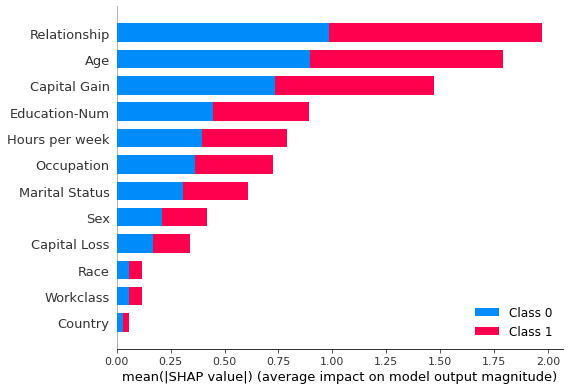

In [ ]:
shap.initjs()
shap.summary_plot(shap_values, X)

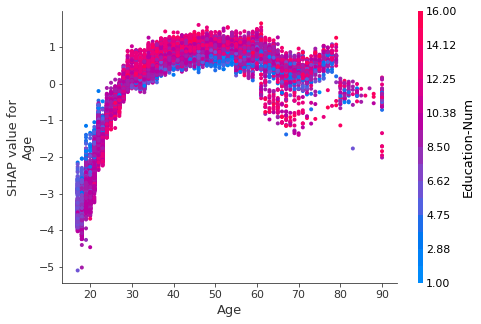

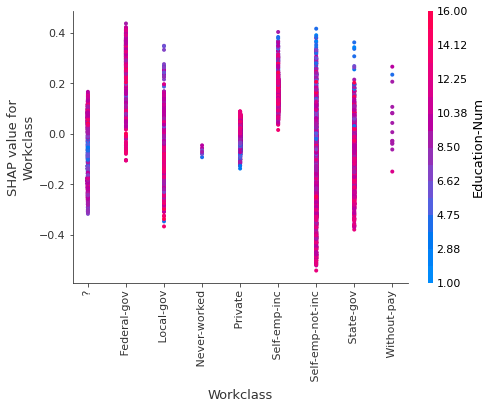

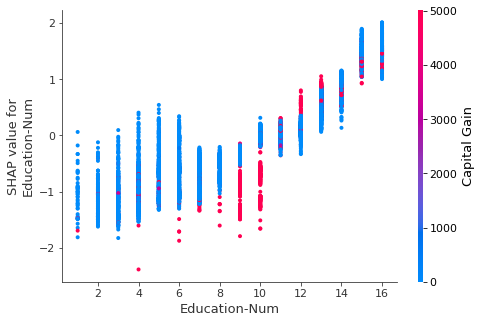

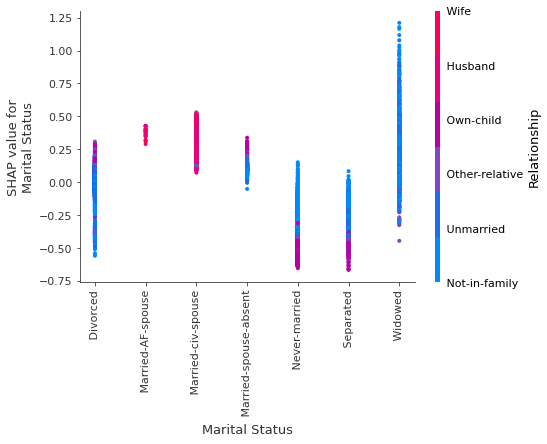

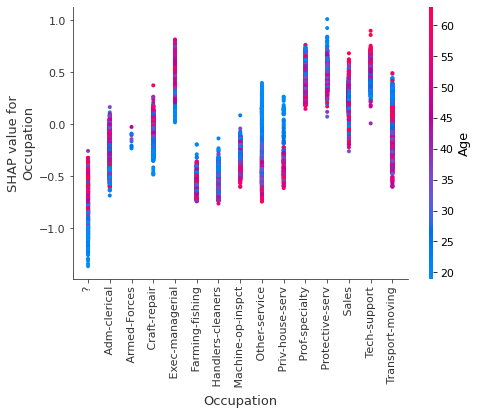

...

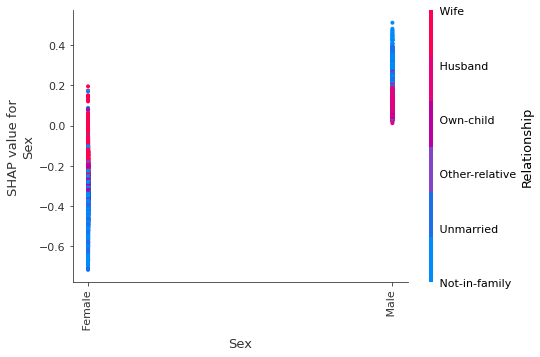

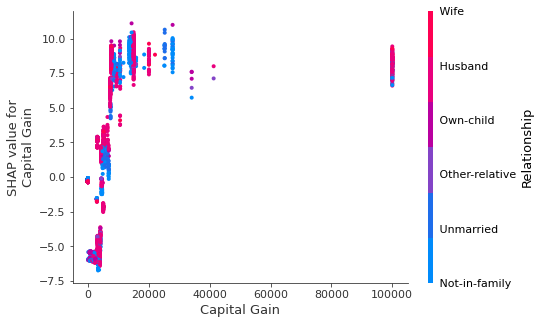

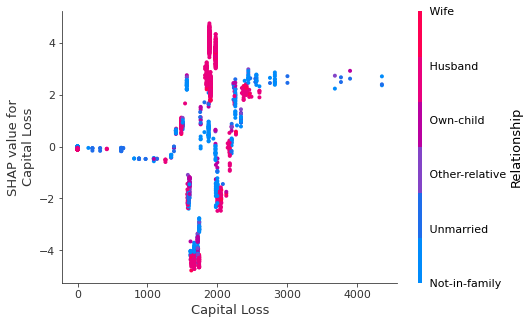

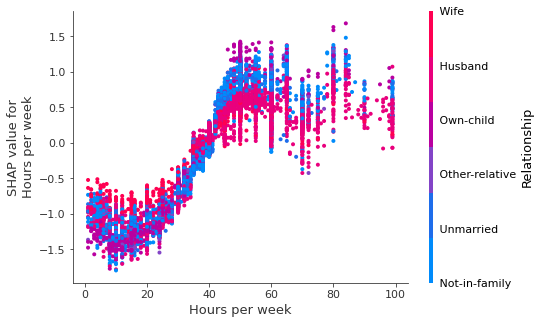

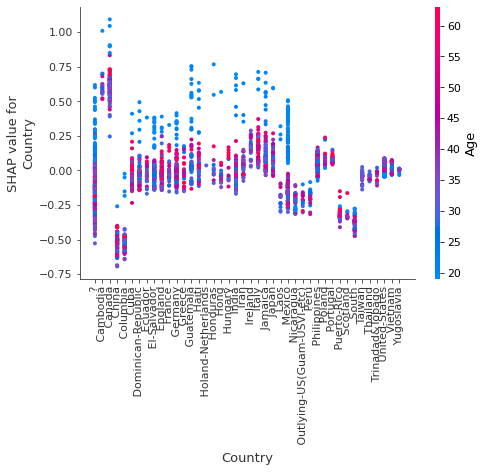

In [ ]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values[1], X, display_features=X_display)

In [ ]:
params = {
    "max_bin": 512,
    "learning_rate": 0.1, #### 
    "boosting_type": "gbdt",  ####
    "objective": "binary",  ####
    "metric": "binary_logloss",  ####
    "num_leaves": 2,
    "verbose": -1,
    "min_data": 100,
    "boost_from_average": True
}

model_ind = lgb.train(params, d_train, 20000, valid_sets=[d_test],   ####
                      early_stopping_rounds=50, verbose_eval=1000)

Training until validation scores don't improve for 50 rounds.
[1000]	valid_0's binary_logloss: 0.295586
[2000]	valid_0's binary_logloss: 0.28955
[3000]	valid_0's binary_logloss: 0.286801
[4000]	valid_0's binary_logloss: 0.284238
[5000]	valid_0's binary_logloss: 0.282737
[6000]	valid_0's binary_logloss: 0.281547
[7000]	valid_0's binary_logloss: 0.280709
[8000]	valid_0's binary_logloss: 0.280044
[9000]	valid_0's binary_logloss: 0.279496
[10000]	valid_0's binary_logloss: 0.279045
[11000]	valid_0's binary_logloss: 0.278711
[12000]	valid_0's binary_logloss: 0.278414
Early stopping, best iteration is:
[12034]	valid_0's binary_logloss: 0.27839


In [ ]:
shap_values_ind = shap.TreeExplainer(model_ind).shap_values(X)

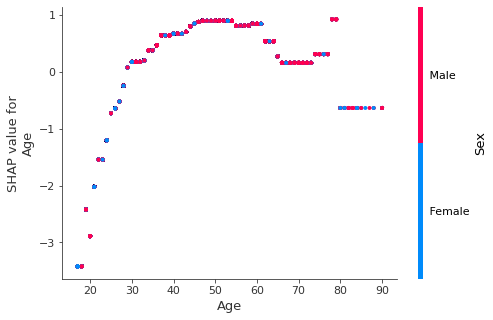

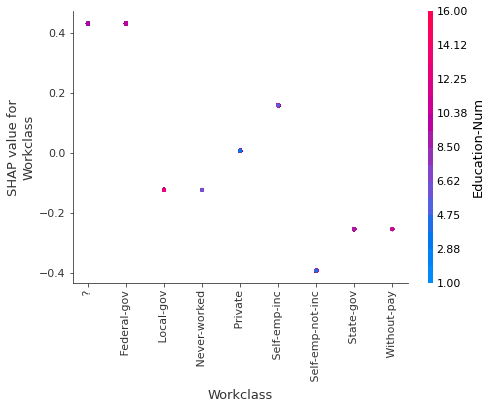

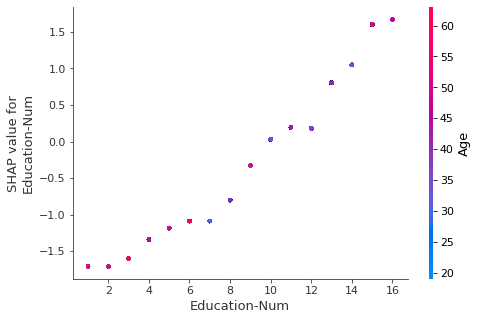

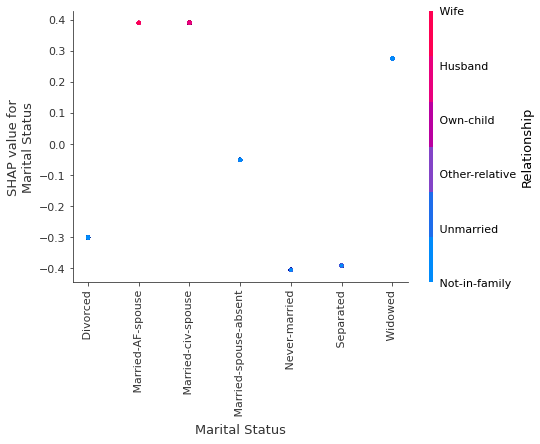

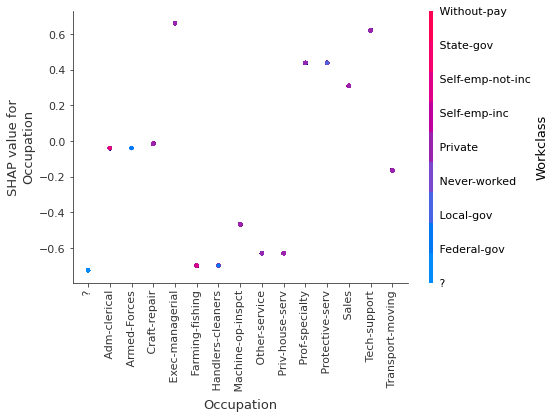

...

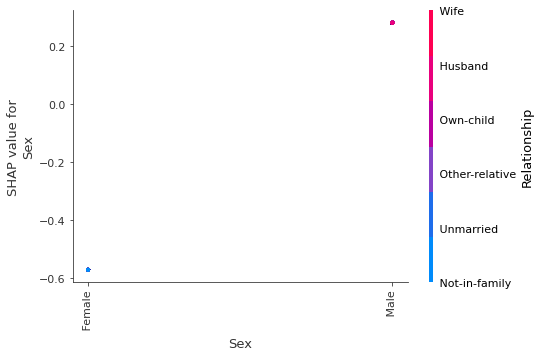

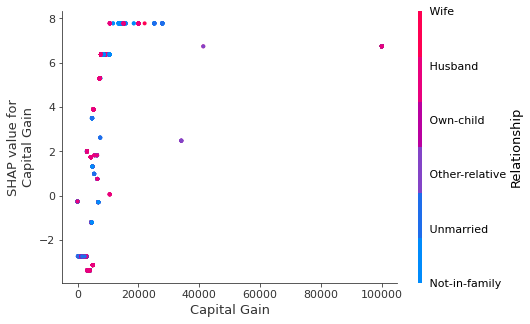

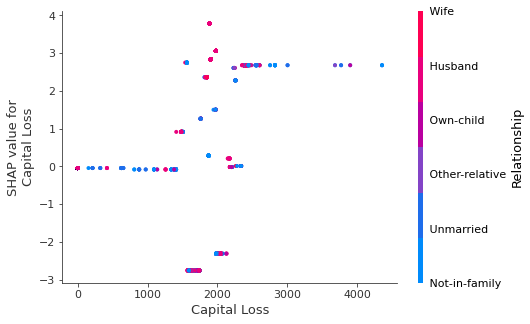

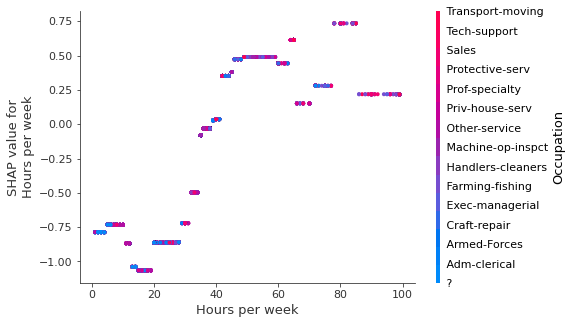

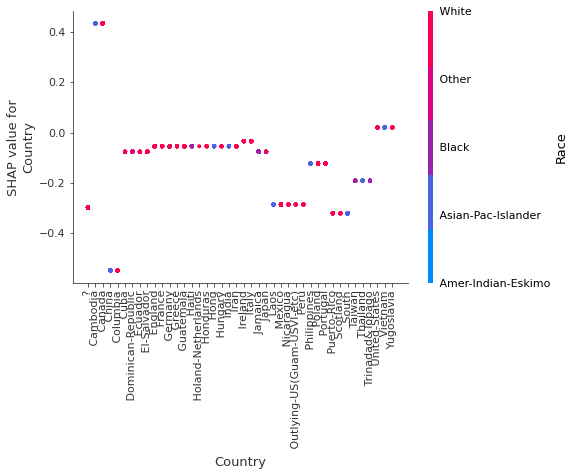

In [ ]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values_ind[1], X, display_features=X_display)

### 문제 02. Shapely 값 계산하기

In [ ]:
# XAI 구현
소득 구간 예측을 위한 US Adult Income 데이터: scikit 기본으로 제공 

LogReg, RFC, GBC, LightGBM (단독 패키지)

1.(온라인) 데이터를 이용하여 로컬 분석환경에서 모델 구축 -> 불러오기(바로 쓰기) -> XAI 구현

2. 데이터와 모델을 로컬 분석환경에 저장 -> (깃헙, svn) 불러오기 -> XAI 구현

# (코랩을 사용할 경우)
3. 데이터와 모델을 로컬 분석환경에 저장 -> 구글 코랩에 업로드 -> 불러오기 -> XAI 구현 --> 문제2번

깃허브 데이터 저장소: https://github.com/mchoimis/financialml

In [ ]:
# 먼저 미리 구축한 모델을 로드합니다 
# 모델 데이터를 업로드할 구글 드라이브와 코랩을 연동하기

from google.colab import drive
drive.mount('/content/gdrive')

## 실행 후 나오는 URL 주소에 가서 로그인을 해주세요.
## 로그인을 하셨다면 나오는 페이지에서 허용(Allow)을 눌러주세요.
## 생성된 authorization code 복사 후 코랩 창으로 돌아와 붙여넣으세요.
## Mounted at /content/gdrive (혹은 지정한 폴더 위치) 라는 메시지가 뜨면 마운트가 완료된 것입니다. 다음으로 넘어가주세요.

In [ ]:
modelpath = '/content/gdrive/My Drive/Colab Notebooks/'

# Gradient Boosting 이진분류 모델 불러오기
with open(modelpath + 'gbc00.pkl', 'rb') as file:
    gbc00 =  pickle.load(file)

In [ ]:
! ls

In [ ]:
with gzip.open(modelpath + 'data00.pickle','rb') as f:
    data00 =  pickle.load(f)
with gzip.open(modelpath + 'data00_X_train.pickle','rb') as f:
    X_train = pickle.load(f)
with gzip.open(modelpath + 'data00_X_test.pickle','rb') as f:
    X_test =  pickle.load(f)    
with gzip.open(modelpath + 'data00_y_train.pickle','rb') as f:
    y_train = pickle.load(f)    
with gzip.open(modelpath + 'data00_y_test.pickle','rb') as f:
    y_test = pickle.load(f)  

In [ ]:
row = X_test.iloc[69]

In [ ]:
row

age               29
workclass          1
education.num     13
marital.status     4
occupation         9
relationship       1
race               4
sex                1
capital.gain       0
capital.loss       0
hours.per.week    40
native.country    38
Name: 20632, dtype: int64

In [ ]:
# binary model 
model = gbc00  ###
# create object that can calculate shap values
explainer = shap.TreeExplainer(model)
# calculate Shap values
shap_values = explainer.shap_values(row)

In [ ]:
model

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=0, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [ ]:
explainer.expected_value

array([-1.95362601])

In [ ]:
shap_values

array([-0.09800983,  0.02408473,  0.44621835, -0.36661002,  0.15613755,
       -0.69589868,  0.00095008,  0.11064805, -0.17727813, -0.04549355,
       -0.05960066,  0.00324026])

In [ ]:
shap_values.sum()

-0.701611842381193

In [ ]:
X_test.shape

(9769, 12)

### 문제 03. `force_plot`으로 개별 데이터의 소득구간 분류 결정근거 해석하기

In [ ]:
shap.initjs() # 구글 코랩 사용시 매 셀마다 넣어주세요
shap.force_plot(explainer.expected_value, shap_values, row) ### 

In [ ]:
대출심사, 신용등급 평가
# 사람: 근거1, 근거2, 경험준칙, 컴플라이언스 ==> 심사 통보 ==> 왜? ==> 설명 
# ML, DL, 자동화된 모델: 변수1, 변수2, .... --> 아웃풋 (등급, 대출여부) --> 심사통보 --> 왜? --> 설명?  

장점
1) 결정근거
2) 개선 가능성
3) 모델의 바이어스 확인, 모델 개선 포인트 찾을 수 있음

단점
1) 개별 데이터 포인트 --> 일반화 하기 어려움 
2) 설명이 가능하지만, 모델 자체가 복잡한 경우: 수정이 쉽지 않아졌다

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

rfc00 = RandomForestClassifier()
rfc00.fit(X_train, y_train) 

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
# 동일 데이터, 다른 모델

row = X_test.iloc[69]
model =  rfc00  ### 
explainer =  shap.TreeExplainer(model)
shap_values =  explainer.shap_values(row)

In [ ]:
explainer.expected_value # binary

array([0.75937697, 0.24062303])

In [ ]:
explainer.expected_value.sum()

1.0000000000000002

In [ ]:
shap_values

[array([ 0.04636123,  0.01591321, -0.06974487,  0.0884697 , -0.01365402,
         0.13023339, -0.00147713, -0.00901621,  0.03062208,  0.00801772,
         0.01643129, -0.00153337]),
 array([-0.04636123, -0.01591321,  0.06974487, -0.0884697 ,  0.01365402,
        -0.13023339,  0.00147713,  0.00901621, -0.03062208, -0.00801772,
        -0.01643129,  0.00153337])]

In [ ]:
shap_values[0].sum()

0.24062302562302257

In [ ]:
explainer

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0], row) ###  

In [ ]:
# 다른 데이터, 동일 모델 
row =  X_test.iloc[43]

In [ ]:
# binary model 
model = gbc00   ####
# create object that can calculate shap values
explainer = shap.TreeExplainer(model)
# calculate Shap values
shap_values = explainer.shap_values(row)

In [ ]:
shap.TreeExplainer(gbc00).expected_value

array([-1.95362601])

In [ ]:
shap_values

array([-0.09648583,  0.02806647, -0.06864247,  0.23001092, -0.0429135 ,
        0.79930022, -0.00543736,  0.11714664, -0.17679346, -0.05130693,
        0.47246484, -0.02946111])

In [ ]:
shap_values[1]

0.0280664691924804

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, row) ### 

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X_test.iloc[821]) ### 

In [ ]:
df1 = pd.DataFrame(X_test.iloc[69])

In [ ]:
df2 = pd.DataFrame(X_test.iloc[43])

In [ ]:
result1 = pd.concat([df1,df2], axis=1)
result1

,20632,28516
age,29,31
workclass,1,3
education.num,13,10
marital.status,4,2
occupation,9,0
relationship,1,0
race,4,1
sex,1,1
capital.gain,0,0
capital.loss,0,0


### 문제 04. `summary_plot`으로 소득 분류 모델 설명하기 

In [ ]:
# binary model 
model = gbc00    ###
# create object that can calculate shap values
explainer =  shap.TreeExplainer(model)
# calculate Shap values
shap_values = explainer.shap_values(X_test)

In [ ]:
shap_values

array([[ 0.54053025,  0.00274581, -0.77119627, ..., -0.0439399 ,
        -0.06122165,  0.0058612 ],
       [-1.10566278,  0.00925174, -0.21816335, ..., -0.04732152,
        -0.50308753,  0.00133536],
       [-1.17154213,  0.01370018, -0.08336037, ..., -0.04722771,
        -0.32250961,  0.00294545],
       ...,
       [-1.01683111,  0.01106945, -0.06196216, ..., -0.04626305,
        -0.04365617,  0.00672051],
       [ 0.10543833,  0.01741565, -0.31680969, ..., -0.04001191,
         0.3592025 ,  0.00611913],
       [ 0.62550754,  0.03920927,  0.02672908, ..., -0.04911062,
         0.47682015,  0.00762165]])

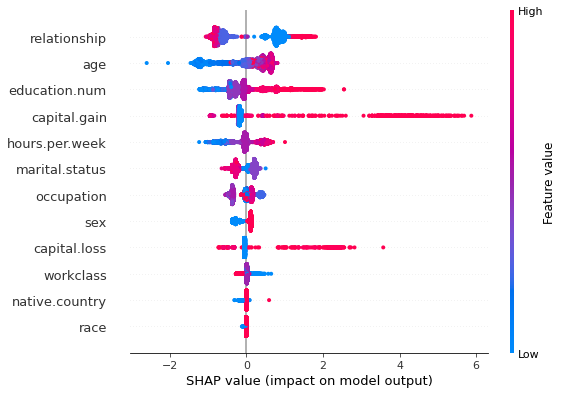

In [ ]:
shap.summary_plot(shap_values, X_test)

### 문제 05. `decision_plot`으로 소득 분류 모델의 결정근거 해석하기

In [ ]:
from pprint import pprint
import lightgbm as lgb
from sklearn.model_selection import train_test_split 

X, y = shap.datasets.adult() 
X_display, y_display = shap.datasets.adult(display=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
d_train = lgb.Dataset(X_train, label=y_train)
d_test = lgb.Dataset(X_test, label=y_test)

params = {
    "max_bin": 512,
    "learning_rate": 0.05, ###
    "boosting_type": "gbdt", ###
    "objective": "binary", ###
    "metric": "binary_logloss", ###
    "num_leaves": 10, 
    "verbose": -1,
    "min_data": 100,
    "boost_from_average": True
}

model = lgb.train(params, d_train, 10000, valid_sets=[d_test], early_stopping_rounds=50, verbose_eval=1000)

Training until validation scores don't improve for 50 rounds.
Early stopping, best iteration is:
[732]	valid_0's binary_logloss: 0.285304


In [ ]:
explainer = shap.TreeExplainer(model) ##
expected_value = explainer.expected_value ##
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

select = range(20) ### 랜덤한 데이터를 지정
features = X_test.iloc[select]
features_display = X_display.loc[features.index]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shap_values = explainer.shap_values(features)[1]
    shap_interaction_values = explainer.shap_interaction_values(features)
if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

Explainer expected value: [-2.50013167]


In [ ]:
features.index

Int64Index([22278,  8950,  7838, 16505, 19140, 12319, 28589, 10000, 28530,
            24237, 12227,   821, 25012, 24579, 29295,  4763, 10371,  6964,
             9907, 30594],
           dtype='int64')

In [ ]:
expected_value[0]

-2.5001316695843245

In [ ]:
explainer.shap_values(features)[1]

array([[-2.75400033e-01, -5.45332791e-03, -3.44619235e-02,
         1.51186090e-01, -2.41890422e-01, -9.33586135e-01,
         1.72851259e-02, -5.29672674e-01, -2.04837809e-01,
        -5.28597181e-02,  6.79814436e-01,  8.42175333e-03],
       [-3.54476463e-01,  1.42946267e-02,  6.44383143e-01,
        -3.52603903e-01,  5.41242165e-01, -9.41093249e-01,
         1.76449398e-02, -3.93660870e-01, -2.43165148e-01,
        -3.18909205e-02, -9.97483788e-04,  2.38348912e-02],
       [-6.42676326e-01,  4.11369720e-02,  1.86004594e-01,
         2.69499963e-01,  3.72689413e-01,  1.05857494e+00,
         1.91661214e-02,  1.61762573e-01, -3.31213507e-01,
        -9.54376636e-02,  7.06826666e-02,  1.34143373e-02],
       [ 3.16969016e-01,  4.98055181e-02, -1.32206913e+00,
         2.14491906e-01,  4.96820295e-02,  1.38722059e+00,
        -6.55360222e-01,  7.23601912e-02, -2.40368127e-01,
         2.15143445e+00,  3.40403252e-02,  1.37784421e-02],
       [ 7.79607181e-01,  5.15577930e-02, -6.3747928

In [ ]:
shap_values

array([[-2.75400033e-01, -5.45332791e-03, -3.44619235e-02,
         1.51186090e-01, -2.41890422e-01, -9.33586135e-01,
         1.72851259e-02, -5.29672674e-01, -2.04837809e-01,
        -5.28597181e-02,  6.79814436e-01,  8.42175333e-03],
       [-3.54476463e-01,  1.42946267e-02,  6.44383143e-01,
        -3.52603903e-01,  5.41242165e-01, -9.41093249e-01,
         1.76449398e-02, -3.93660870e-01, -2.43165148e-01,
        -3.18909205e-02, -9.97483788e-04,  2.38348912e-02],
       [-6.42676326e-01,  4.11369720e-02,  1.86004594e-01,
         2.69499963e-01,  3.72689413e-01,  1.05857494e+00,
         1.91661214e-02,  1.61762573e-01, -3.31213507e-01,
        -9.54376636e-02,  7.06826666e-02,  1.34143373e-02],
       [ 3.16969016e-01,  4.98055181e-02, -1.32206913e+00,
         2.14491906e-01,  4.96820295e-02,  1.38722059e+00,
        -6.55360222e-01,  7.23601912e-02, -2.40368127e-01,
         2.15143445e+00,  3.40403252e-02,  1.37784421e-02],
       [ 7.79607181e-01,  5.15577930e-02, -6.3747928

In [ ]:
features_display

,Age,Workclass,Education-Num,Marital Status,Occupation,Relationship,Race,Sex,Capital Gain,Capital Loss,Hours per week,Country
22278,27.0,Private,10.0,Divorced,Adm-clerical,Unmarried,White,Female,0.0,0.0,44.0,United-States
8950,27.0,Private,13.0,Never-married,Prof-specialty,Not-in-family,White,Female,0.0,0.0,40.0,United-States
7838,25.0,Private,12.0,Married-civ-spouse,Sales,Husband,White,Male,0.0,0.0,40.0,United-States
16505,46.0,Private,3.0,Married-civ-spouse,Transport-moving,Husband,Amer-Indian-Eskimo,Male,0.0,1902.0,40.0,United-States
19140,45.0,Private,7.0,Divorced,Transport-moving,Not-in-family,White,Male,0.0,2824.0,76.0,United-States
12319,29.0,Private,13.0,Married-civ-spouse,Prof-specialty,Own-child,White,Male,0.0,0.0,75.0,United-States
28589,42.0,Local-gov,9.0,Separated,Other-service,Not-in-family,Black,Female,0.0,0.0,60.0,?
10000,34.0,Private,10.0,Divorced,Adm-clerical,Not-in-family,White,Female,0.0,0.0,50.0,United-States
28530,60.0,Local-gov,11.0,Divorced,Prof-specialty,Unmarried,White,Male,0.0,0.0,40.0,United-States
24237,19.0,Private,10.0,Never-married,Adm-clerical,Own-child,White,Female,0.0,0.0,40.0,United-States


In [ ]:
shap_values[0]

array([-0.27540003, -0.00545333, -0.03446192,  0.15118609, -0.24189042,
       -0.93358614,  0.01728513, -0.52967267, -0.20483781, -0.05285972,
        0.67981444,  0.00842175])

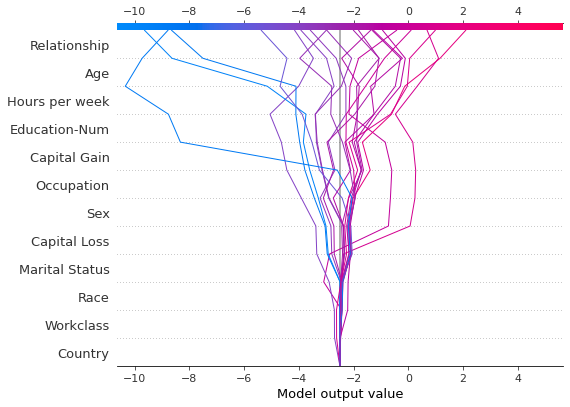

In [ ]:
shap.decision_plot(expected_value, shap_values, features_display) 

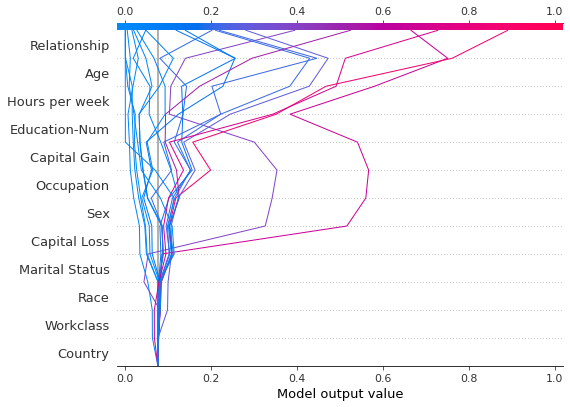

In [ ]:
shap.decision_plot(expected_value, shap_values, features_display, link='logit') # link function 

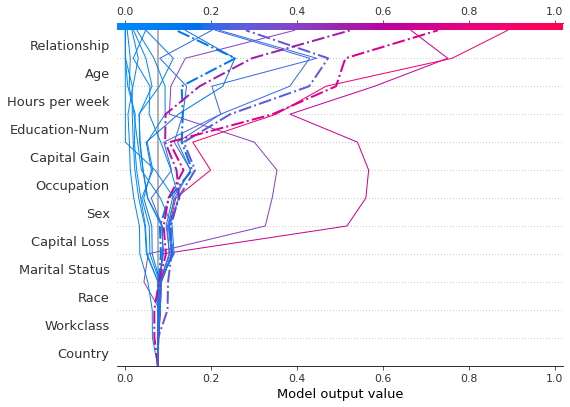

In [ ]:
# p(x) > 0.5 --> 1, p(x) < 0.5 --> 0  ==> 실제 값은? 
y_pred = (shap_values.sum(1) + expected_value) > 0
misclassified = y_pred != y_test[select]

shap.decision_plot(expected_value, shap_values, features_display, link='logit', highlight=misclassified)

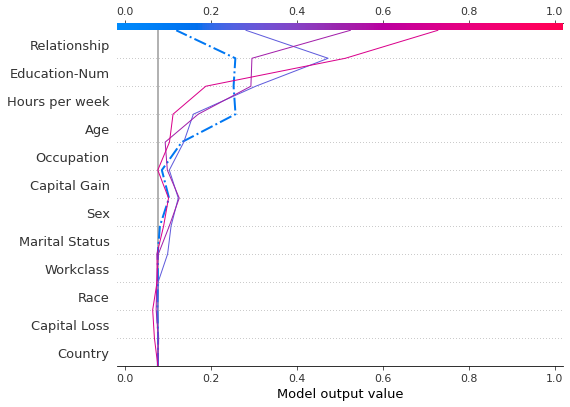

In [ ]:
shap.decision_plot(expected_value, shap_values[misclassified], features_display[misclassified],
                   link='logit', highlight=0)

### 문제 06. `dependence_plot`으로 변수간 관계 확인하기

In [ ]:
# X_train 컬럼 확인하기

X_train.columns

Index(['Age', 'Workclass', 'Education-Num', 'Marital Status', 'Occupation',
       'Relationship', 'Race', 'Sex', 'Capital Gain', 'Capital Loss',
       'Hours per week', 'Country'],
      dtype='object')

In [ ]:
explainer =  shap.TreeExplainer(model)
shap_values =  explainer.shap_values(X)

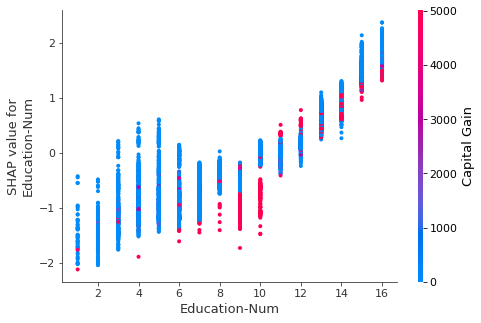

In [ ]:
# 하나의 피처가 전체 예측에 미치는 영향 시각화
shap.dependence_plot('Education-Num', shap_values[1], X, interaction_index='Capital Gain')

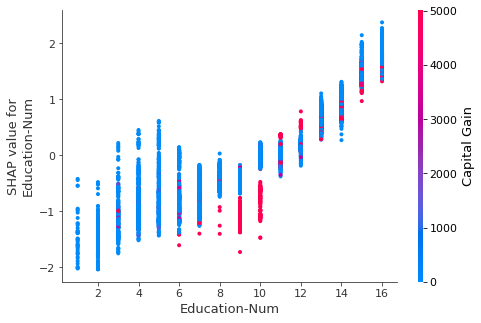

In [ ]:
shap_values =  explainer.shap_values(X_train)

# 하나의 피처가 전체 예측에 미치는 영향 시각화
shap.dependence_plot('Education-Num', shap_values[1], X_train, interaction_index='Capital Gain')

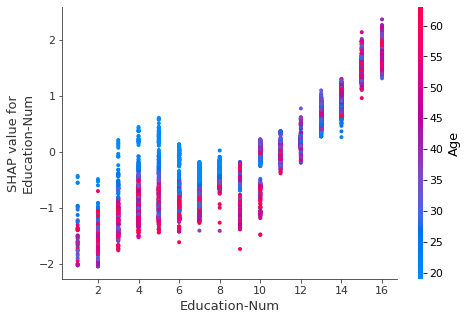

In [ ]:
# 하나의 피처가 전체 예측에 미치는 영향 시각화
shap.dependence_plot('Education-Num', shap_values[1], X_train, interaction_index='Age')

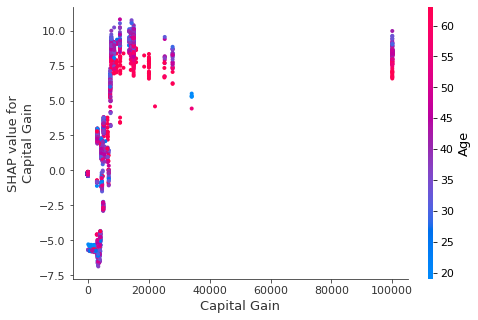

In [ ]:
shap.dependence_plot('Capital Gain', shap_values[1], X_train, interaction_index='Age')

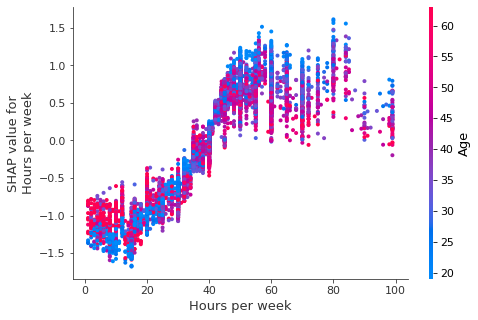

In [ ]:
shap.dependence_plot('Hours per week', shap_values[1], X_train, interaction_index='Age')

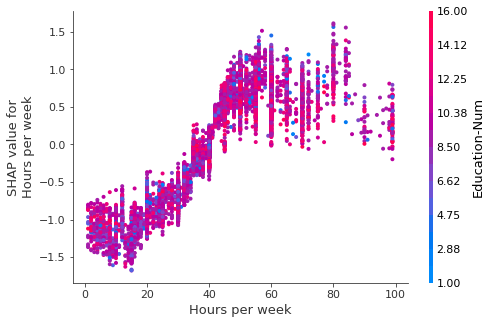

In [ ]:
shap.dependence_plot('Hours per week', shap_values[1], X_train, interaction_index='Education-Num')

### 참고: LIME 과 비교

In [ ]:
# ! pip install lime

In [ ]:
# 개별 데이터 불러오기
row = X_test.iloc[69]

In [ ]:
row

age               29
workclass          1
education.num     13
marital.status     4
occupation         9
relationship       1
race               4
sex                1
capital.gain       0
capital.loss       0
hours.per.week    40
native.country    38
Name: 20632, dtype: int64

In [ ]:
# 동일 데이터에 대하여 LIME 해석 구현하기
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_test.columns,
                                                    discretize_continuous=True)

exp = explainer.explain_instance(row, gbc00.predict_proba, num_features = 8 ) ###
exp.show_in_notebook(show_table=True)

In [ ]:
# 동일 데이터에 대하여 SHAP 해석 구현하기

explainer =  shap.TreeExplainer(gbc00)
shap_values =  explainer.shap_values(row)

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, row ) ### 

### 문제 07. 해석을 바탕으로 모델을 개선하기

In [ ]:
# 1. LIME과 SHAP 해석이 유사하고, 예측이 확실한 경우

In [ ]:
row = X_test.iloc[3333]

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_test.columns,
                                                    discretize_continuous=True)

exp = explainer.explain_instance(row, gbc00.predict_proba, num_features=8)
exp.show_in_notebook(show_table=True)

In [ ]:
explainer = shap.TreeExplainer(gbc00)
shap_values = explainer.shap_values(row) ##

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, row) 

In [ ]:
# 2. LIME과 SHAP 해석이 유사하고, 예측이 불확실한 경우

In [ ]:
row =  X_test.iloc[1690]

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names= X_test.columns,
                                                    discretize_continuous = True  )

exp = explainer.explain_instance(row, gbc00.predict_proba, num_features=8)
exp.show_in_notebook(show_table=True)

In [ ]:
row =  X_test.iloc[1690]

explainer = shap.TreeExplainer(gbc00)
shap_values = explainer.shap_values(row) ##

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, row ) ##

In [ ]:
# 3. LIME과 SHAP 해석이 상이한 경우

In [ ]:
row = X_test.iloc[8765]

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_test.columns,
                                                    discretize_continuous=True)

exp = explainer.explain_instance(row, gbc00.predict_proba, num_features=8)
exp.show_in_notebook(show_table=True)

In [ ]:
explainer = shap.TreeExplainer(gbc00)
shap_values = explainer.shap_values(row)

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, row) 

## Step 2. 이미지 분류 알고리즘에 LIME 적용하기

### 문제 08. 이미지 데이터 로드하기

In [ ]:
from skimage.color import gray2rgb, rgb2gray
from skimage.util import montage
from sklearn.datasets import fetch_olivetti_faces

In [ ]:
400 * 4096 

downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data


(-0.5, 1279.5, 1279.5, -0.5)

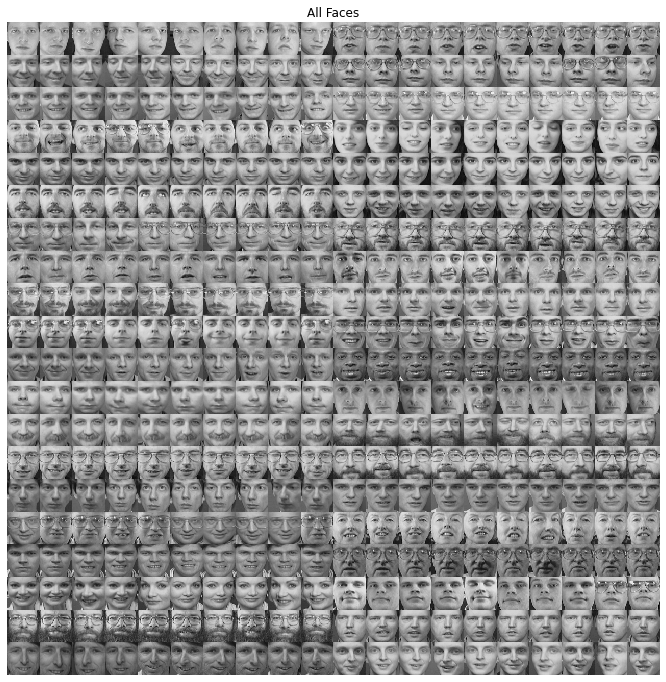

In [ ]:
# 이미지 데이터 저장하기
faces = fetch_olivetti_faces()  

# Step 1: 이미지 데이터를 학습에 적합하도록 벡터화하기
X_vec = np.stack([gray2rgb(iimg)
                 for iimg in faces.data.reshape((-1, 64, 64))],0)

# Step 2: 이미지에 대응하는 레이블을 정수형으로 저장하기
y_vec = faces.target.astype(np.uint8)

# Quiz: 이미지 전처리가 끝난 데이터셋의 모양은?

# Step 3: 이미지를 몽타주 형태로 나타내기
fig, ax1 = plt.subplots(1, 1, figsize=(12, 12))
ax1.imshow(montage(X_vec[:, :, :, 0]),
          cmap='gray', interpolation = 'none')
ax1.set_title('All Faces')
ax1.axis('off')

In [ ]:
y_vec

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  6,  6,  6,  6,  6,  6,  6,  6,
        6,  6,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9, 10, 10,
       10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11,
       11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13,
       13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16,
       17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18, 18, 18,
       18, 18, 18, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 20, 20, 20, 20,
       20, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22,
       22, 22, 22, 22, 22

(-0.5, 63.5, 63.5, -0.5)

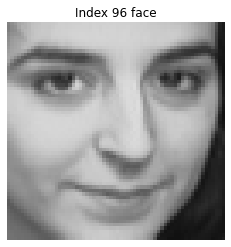

In [ ]:
index = 96
plt.imshow(X_vec[index], cmap='gray')
plt.title('Index {} face'.format(index))
plt.axis('off')

### 문제 09. 다층신경망(MLP)으로 이미지 분류 알고리즘 구현하기

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_vec, y_vec, test_size=0.3, random_state=0 ) # 채워주세요

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import Normalizer
from sklearn.neural_network import MLPClassifier

class PipeStep(object):
    def __init__(self, step_func):
        self._step_func=step_func
        
    def fit(self, *args):
        return self
    
    def transform(self, X):
        return self._step_func(X)
    
# 파이프라인에 makegray_step 과 flatten_step 이라는 전처리 과정을 넣기

makegray_step = PipeStep(lambda img_list:
                         [rgb2gray(img) for img in img_list] )
flatten_step = PipeStep(lambda img_list:
                       [img.ravel() for img in img_list] )

# 간단한 파이프라인 만들기

simple_pipeline = Pipeline([
    ('Make Gray', makegray_step ),
    ('Flatten Image', flatten_step ),
    ('Normalize', Normalizer() ), ###
    ('MLP', MLPClassifier(
        activation = 'relu', ###
        alpha =  1e-7, ###
        epsilon = 1e-6, ###
        hidden_layer_sizes=(800, 120), ### 800, 120
        random_state=0))    
])

In [ ]:
# 학습에 시간이 걸리니 유의해 주세요
simple_pipeline.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('Make Gray', <__main__.PipeStep object at 0x7f329f19c690>),
                ('Flatten Image', <__main__.PipeStep object at 0x7f329f19c8d0>),
                ('Normalize', Normalizer(copy=True, norm='l2')),
                ('MLP',
                 MLPClassifier(activation='relu', alpha=1e-07,
                               batch_size='auto', beta_1=0.9, beta_2=0.999,
                               early_stopping=False, epsilon=1e-06,
                               hidden_layer_sizes=(800, 120),
                               learning_rate='constant',
                               learning_rate_init=0.001, max_fun=15000,
                               max_iter=200, momentum=0.9, n_iter_no_change=10,
                               nesterovs_momentum=True, power_t=0.5,
                               random_state=0, shuffle=True, solver='adam',
                               tol=0.0001, validation_fraction=0.1,
                               verbose=F

In [ ]:
# 정확도 측정하기
pipe_pred_test = simple_pipeline.predict(X_test)
pipe_pred_prop = simple_pipeline.predict_proba(X_test)

# 이미지 분류 결과 확인하기
from sklearn.metrics import classification_report
print(classification_report(y_true = y_test, y_pred = pipe_pred_test ))

              precision    recall  f1-score   support

           0       0.67      0.33      0.44         6
           1       1.00      0.75      0.86         4
           2       1.00      0.67      0.80         3
           3       1.00      1.00      1.00         1
           4       0.50      0.50      0.50         2
           5       1.00      1.00      1.00         5
           6       1.00      0.80      0.89         5
           7       0.67      0.67      0.67         3
           8       1.00      0.50      0.67         2
           9       1.00      1.00      1.00         2
          10       1.00      1.00      1.00         4
          11       0.50      1.00      0.67         1
          12       0.67      1.00      0.80         2
          13       1.00      1.00      1.00         3
          14       1.00      1.00      1.00         5
          15       0.75      0.60      0.67         5
          16       0.00      0.00      0.00         0
          17       1.00    

### 문제 10. 이미지 분류 모델의 분류 결정근거 설명하기

In [ ]:
# LIME을 먼저 설치해주세요

In [ ]:
from lime import lime_image
from lime.wrappers.scikit_image import SegmentationAlgorithm

explainer = lime_image.LimeImageExplainer()

segmenter = SegmentationAlgorithm('slic', ## 이미지 분할 알고리즘 파라미터
                               n_segments = 100,
                               compactness = 1,
                               sigma = 1)

In [ ]:
# 설명 모델을 구축하는 코드

test_index =  99

exp = explainer.explain_instance(X_test[test_index],
                                classifier_fn = simple_pipeline.predict_proba,
                                top_labels = 6 ,       ##  
                                num_samples = 1000 ,   ## 
                                segmentation_fn = segmenter)

In [ ]:
y_test[99]

36

In [ ]:
y_test

array([13, 30, 34, 19, 24,  6, 15, 26, 14, 21,  3, 13, 11, 34,  1,  5, 29,
       14, 20, 19, 17, 26, 12, 34, 17, 31,  7,  1, 28, 10, 17, 30, 33, 22,
        6,  7,  9, 17, 17, 39, 10, 32,  0,  0, 29,  5, 37, 25, 15, 23, 24,
       14, 29, 17, 28, 31,  5,  1,  2,  4,  7, 27,  0, 35, 19, 37, 14,  0,
       15, 31,  0, 26,  6,  2, 10,  1, 36, 30, 36, 32, 33,  6,  5, 10, 30,
       22, 12, 37, 39, 32, 38, 25,  5,  0, 19, 14, 13, 39, 26, 36, 25,  6,
       31, 15, 28, 34,  8, 34, 15, 29,  9,  8, 29,  2, 36, 21, 25,  4, 23,
       34], dtype=uint8)

### 참고
`get_image_and_mask`는 다음과 같은 파라미터가 필요합니다.


- XAI를 수행할 이미지 (원본 데이터)


- `positive_only`: 설명 모델이 가장 높은 확률로 분류한 라벨을 인식하는데 도움이 된(positive) 이미지 영역만 출력하는 파라미터, `False`를 입력하면 모든 이미지 조각에 대한 마스킹 레이블을 출력함


- `num_features` : XAI에 사용하기 위한 분할 영역의 크기


- `hide_rest` : 이미지를 분류하는데 도움이 되는 서브모듈만 출력할지 결정, `True` 라면 XAI에 도움이 되는 영역을 제외하고 나머지 영역을 흑백으로 출력


In [ ]:
# 설명 모델을 구축하는 코드
# Case 1

test_index =  83

exp = explainer.explain_instance(X_test[test_index],
                                classifier_fn = simple_pipeline.predict_proba,
                                top_labels = 6 ,       ##  
                                num_samples = 1000 ,   ## 
                                segmentation_fn = segmenter)

In [ ]:
y_test[83]

10

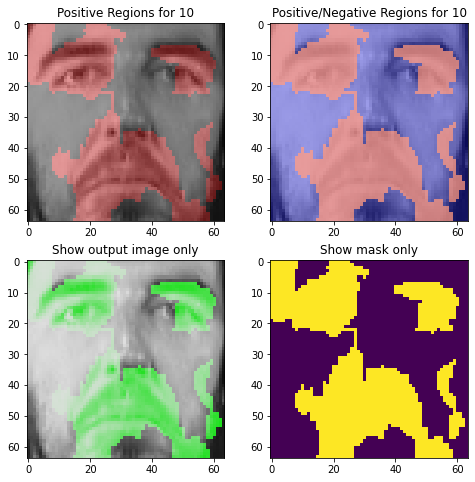

In [ ]:
# 결정근거 설명하기

from skimage.color import label2rgb

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(8, 8))

## 예측에 도움이 되는 세그먼트 출력하기
temp, mask = exp.get_image_and_mask(y_test[test_index], ###
                                   positive_only = True, ###
                                   num_features = 8,
                                   hide_rest = False)

ax1.imshow(label2rgb(mask, temp, bg_label = 0), interpolation = 'nearest')
ax1.set_title('Positive Regions for {}'.format(y_test[test_index]))

## 모든 세그먼트 출력하기
temp, mask = exp.get_image_and_mask(y_test[test_index], ###
                                   positive_only = False, ###
                                   num_features = 8,
                                   hide_rest = False)

ax2.imshow(label2rgb(4 - mask, temp, bg_label = 0), interpolation = 'nearest')
ax2.set_title('Positive/Negative Regions for {}'.format(y_test[test_index]))

## 이미지만 출력
ax3.imshow(temp, interpolation = 'nearest')
ax3.set_title('Show output image only')

## 마스크만 출력
ax4.imshow(mask, interpolation = 'nearest')
ax4.set_title('Show mask only')

plt.show()

In [ ]:
mask

array([[1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [ ]:
# 설명 모델을 구축하는 코드
# Case 2

test_index =  29

exp = explainer.explain_instance(X_test[test_index],
                                classifier_fn = simple_pipeline.predict_proba,
                                top_labels = 6 ,       ##  
                                num_samples = 1000 ,   ## 
                                segmentation_fn = segmenter)


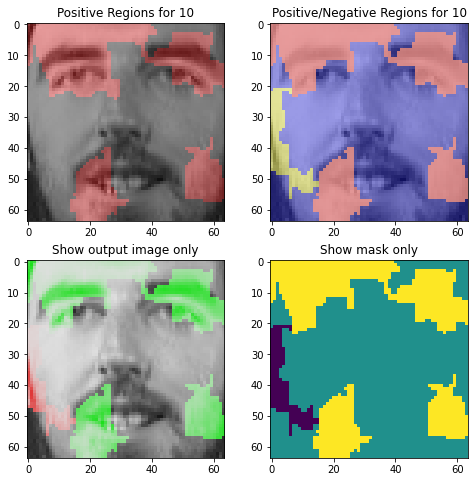

In [ ]:
# 결정근거 설명하기

from skimage.color import label2rgb

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(8, 8))

## 예측에 도움이 되는 세그먼트 출력하기
temp, mask = exp.get_image_and_mask(y_test[test_index], ###
                                   positive_only = True, ###
                                   num_features = 8,
                                   hide_rest = False)

ax1.imshow(label2rgb(mask, temp, bg_label = 0), interpolation = 'nearest')
ax1.set_title('Positive Regions for {}'.format(y_test[test_index]))

## 모든 세그먼트 출력하기
temp, mask = exp.get_image_and_mask(y_test[test_index], ###
                                   positive_only = False, ###
                                   num_features = 8,
                                   hide_rest = False)

ax2.imshow(label2rgb(4 - mask, temp, bg_label = 0), interpolation = 'nearest')
ax2.set_title('Positive/Negative Regions for {}'.format(y_test[test_index]))

## 이미지만 출력
ax3.imshow(temp, interpolation = 'nearest')
ax3.set_title('Show output image only')

## 마스크만 출력
ax4.imshow(mask, interpolation = 'nearest')
ax4.set_title('Show mask only')

plt.show()

In [ ]:
# 설명 모델을 구축하는 코드
# Case 2

test_index =  99

exp = explainer.explain_instance(X_test[test_index],
                                classifier_fn = simple_pipeline.predict_proba,
                                top_labels = 6 ,       ##  
                                num_samples = 1000 ,   ## 
                                segmentation_fn = segmenter)


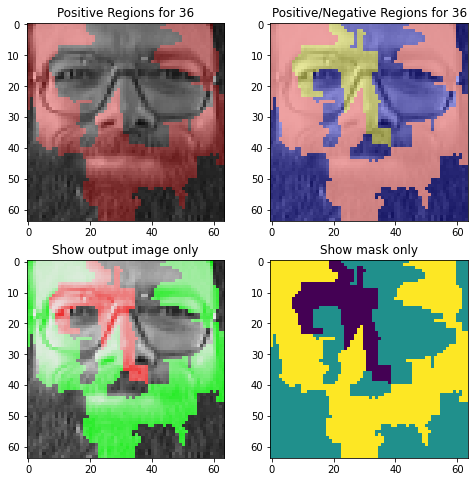

In [ ]:
# 결정근거 설명하기

from skimage.color import label2rgb

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(8, 8))

## 예측에 도움이 되는 세그먼트 출력하기
temp, mask = exp.get_image_and_mask(y_test[test_index], ###
                                   positive_only = True, ###
                                   num_features = 8,
                                   hide_rest = False)

ax1.imshow(label2rgb(mask, temp, bg_label = 0), interpolation = 'nearest')
ax1.set_title('Positive Regions for {}'.format(y_test[test_index]))

## 모든 세그먼트 출력하기
temp, mask = exp.get_image_and_mask(y_test[test_index], ###
                                   positive_only = False, ###
                                   num_features = 8,
                                   hide_rest = False)

ax2.imshow(label2rgb(4 - mask, temp, bg_label = 0), interpolation = 'nearest')
ax2.set_title('Positive/Negative Regions for {}'.format(y_test[test_index]))

## 이미지만 출력
ax3.imshow(temp, interpolation = 'nearest')
ax3.set_title('Show output image only')

## 마스크만 출력
ax4.imshow(mask, interpolation = 'nearest')
ax4.set_title('Show mask only')

plt.show()

### 문제 11. 개별 데이터에 대하여 설명하기

In [ ]:
# 설명 모델을 구축하는 코드

test_index = 99

exp = explainer.explain_instance(X_test[test_index],
                                classifier_fn = simple_pipeline.predict_proba ,
                                top_labels = 6,       ##  
                                num_samples = 10000 ,   ## 
                                segmentation_fn = segmenter )

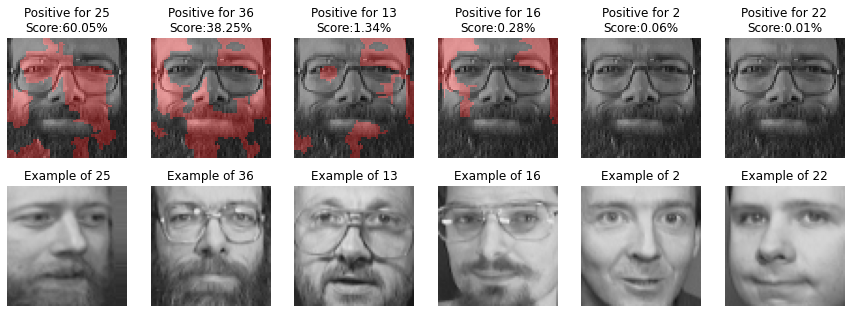

In [ ]:
# 개별 데이터(하나의 인물)에 대하여 부가설명을 출력
# Case 2

fig, m_axes = plt.subplots(2, 6, figsize = (15, 5))

for i, (c_ax, gt_ax) in zip(exp.top_labels, m_axes.T):
    temp, mask = exp.get_image_and_mask(i,
                                       positive_only = True,
                                       num_features = 12,
                                       hide_rest = False,
                                       min_weight = 0.001)
    
    c_ax.imshow(label2rgb(mask, temp, bg_label = 0), interpolation = 'nearest')
    c_ax.set_title('Positive for {}\nScore:{:2.2f}%'.format(i, 100*pipe_pred_prop[test_index, i]))
    c_ax.axis('off')
    
    face_id = np.random.choice(np.where(y_train==i)[0])
    
    gt_ax.imshow(X_train[face_id])
    gt_ax.set_title('Example of {}'.format(i))
    gt_ax.axis('off')

In [ ]:
exp.top_labels

[25, 36, 13, 16, 2, 22]

In [ ]:
# 설명 모델을 구축하는 코드

test_index = 11

exp = explainer.explain_instance(X_test[test_index],
                                classifier_fn = simple_pipeline.predict_proba ,
                                top_labels = 6,       ##  
                                num_samples = 10000 ,   ## 
                                segmentation_fn = segmenter )

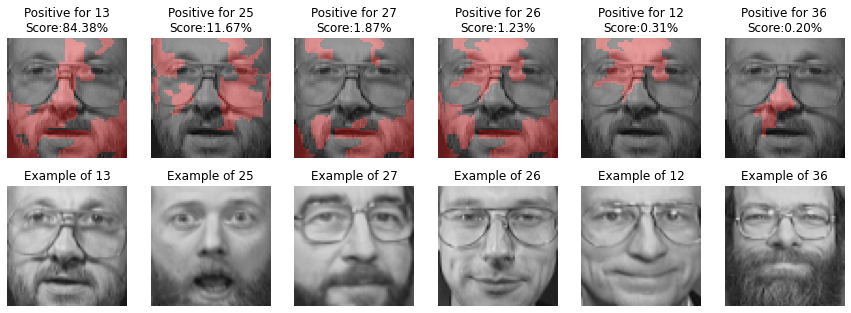

In [ ]:
# 개별 데이터(하나의 인물)에 대하여 부가설명을 출력
# Case 2

fig, m_axes = plt.subplots(2, 6, figsize = (15, 5))

for i, (c_ax, gt_ax) in zip(exp.top_labels, m_axes.T):
    temp, mask = exp.get_image_and_mask(i,
                                       positive_only = True,
                                       num_features = 12,
                                       hide_rest = False,
                                       min_weight = 0.001)
    
    c_ax.imshow(label2rgb(mask, temp, bg_label = 0), interpolation = 'nearest')
    c_ax.set_title('Positive for {}\nScore:{:2.2f}%'.format(i, 100*pipe_pred_prop[test_index, i]))
    c_ax.axis('off')
    
    face_id = np.random.choice(np.where(y_train==i)[0])
    
    gt_ax.imshow(X_train[face_id])
    gt_ax.set_title('Example of {}'.format(i))
    gt_ax.axis('off')

### 문제 12. 해석을 바탕으로 모델을 개선하기

In [ ]:
# 설명 모델을 구축하는 코드

test_index = 27

exp = explainer.explain_instance(X_test[test_index],
                                classifier_fn = simple_pipeline.predict_proba,
                                top_labels = 6 ,       ##  
                                num_samples = 1000 ,   ## 
                                segmentation_fn = segmenter )

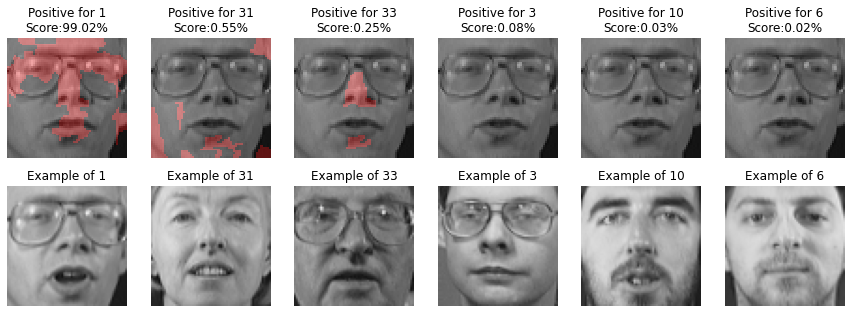

In [ ]:
fig, m_axes = plt.subplots(2, 6, figsize = (15, 5))

for i, (c_ax, gt_ax) in zip(exp.top_labels, m_axes.T):
    temp, mask = exp.get_image_and_mask(i,
                                       positive_only = True,
                                       num_features = 12,
                                       hide_rest = False,
                                       min_weight = 0.001)
    
    c_ax.imshow(label2rgb(mask, temp, bg_label = 0), interpolation = 'nearest')
    c_ax.set_title('Positive for {}\nScore:{:2.2f}%'.format(i, 100*pipe_pred_prop[test_index, i]))
    c_ax.axis('off')
    
    face_id = np.random.choice(np.where(y_train==i)[0])
    
    gt_ax.imshow(X_train[face_id])
    gt_ax.set_title('Example of {}'.format(i))
    gt_ax.axis('off')

In [ ]:
exp.top_labels

[10, 18, 26, 1, 3, 27]

## Step 3. 요약
- 1) SHAP 개념에 대한 이해
- 2) SHAP 알고리즘 구현: `shap.TreeExplainer`, `shap_values`
- 3) 머신러닝 모델의 결정근거 해석
  -  `summary_plot`, `decision_plot`, `dependence_plot`
  -  `get_image_and_mask`
- 4) 개별 데이터의 결정근거 해석
  - `force_plot`, `summary_plot` 이용하기
  - `explain_instance` 이용하기
- 5) 해석을 바탕으로 모델을 개선하는 방법 습득
  -  `LimeTabularExplainer`와의 비교
  - `top_labels`를 이용
